In [4]:
pip install ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.6/216.6 kB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 51.4 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [9]:
import zipfile
import os
from pathlib import Path
from IPython.display import display
import ipywidgets as widgets

upload_widget = widgets.FileUpload(accept='.zip', multiple=False)
display(upload_widget)

def save_and_extract(change):
    if upload_widget.value:
        for filename, file_info in upload_widget.value.items():
            zip_path = Path("img_align_celeba.zip")
            with open(zip_path, "wb") as f:
                f.write(file_info["content"])

            extract_path = Path("celeba/img_align_celeba")
            extract_path.mkdir(parents=True, exist_ok=True)

            with zipfile.ZipFile(zip_path, 'r') as zip_ref:
                zip_ref.extractall(extract_path)

            print("Extracted to:", extract_path)
            print("Total images:", len(os.listdir(extract_path)))
            print("Sample files:", os.listdir(extract_path)[:5])

upload_widget.observe(save_and_extract, names='value')


FileUpload(value=(), accept='.zip', description='Upload')

In [18]:
import zipfile
from pathlib import Path
import os

zip_path = Path("occlufix/celeba.zip")
extract_path = Path("celeba/img_align_celeba")

extract_path.mkdir(parents=True, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extracted to:", extract_path)
print("Total images:", len(list(extract_path.iterdir())))
print("Sample files:", sorted(os.listdir(extract_path))[:5])


Extracted to: celeba/img_align_celeba
Total images: 5
Sample files: ['img_align_celeba', 'list_attr_celeba.csv', 'list_bbox_celeba.csv', 'list_eval_partition.csv', 'list_landmarks_align_celeba.csv']


In [30]:
import zipfile
from pathlib import Path
import shutil
import os

zip_path = Path("occlufix/celeba.zip")
extract_root = Path("celeba/raw")
final_img_dir = Path("celeba/imgs")
final_img_dir.mkdir(parents=True, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_root)

candidates = list(extract_root.rglob("*.jpg"))
for img in candidates:
    shutil.move(str(img), final_img_dir / img.name)

print("Images moved to:", final_img_dir)
print("Total images:", len(list(final_img_dir.glob("*.jpg"))))
print("Sample:", sorted([f.name for f in final_img_dir.glob('*.jpg')])[:5])


Images moved to: celeba/imgs
Total images: 202599
Sample: ['000001.jpg', '000002.jpg', '000003.jpg', '000004.jpg', '000005.jpg']


In [32]:
from pathlib import Path
import os
import random

print("Current working directory:", os.getcwd())

img_dir = Path("occlufix/celeba/imgs")
jpg_files = sorted(img_dir.glob("*.jpg"))

print("Total .jpg images:", len(jpg_files))
if jpg_files:
    print("Random samples:", random.sample([f.name for f in jpg_files], 5))
else:
    print("No .jpg files found.")


Current working directory: /home/rohaan
Total .jpg images: 202599
Random samples: ['066868.jpg', '130938.jpg', '044985.jpg', '115166.jpg', '152711.jpg']


In [33]:
print(Path("occlufix/celeba/imgs").resolve())


/home/rohaan/occlufix/celeba/imgs


In [35]:
pip install matplotlib

  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.3/106.3 kB 6.4 MB/s eta 0:00:00
  Using cached kiwisolver-1.4.8-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.2 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 44.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.7/323.7 kB 42.3 MB/s eta 0:00:00
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 72.2 MB/s eta 0:00:00ta 0:00:01
Using cached kiwisolver-1.4.8-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.5 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.1/111.1 kB 14.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [36]:
import torch

if torch.cuda.is_available():
    print("CUDA available:", torch.cuda.get_device_name(0))
    print("Memory (MB):", torch.cuda.get_device_properties(0).total_memory // 1024**2)
else:
    print("CUDA not available")


CUDA available: NVIDIA GeForce RTX 3060
Memory (MB): 12287


In [40]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118


In [41]:
!pip install matplotlib pillow numpy ipywidgets tqdm

  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
Using cached tqdm-4.67.1-py3-none-any.whl (78 kB)


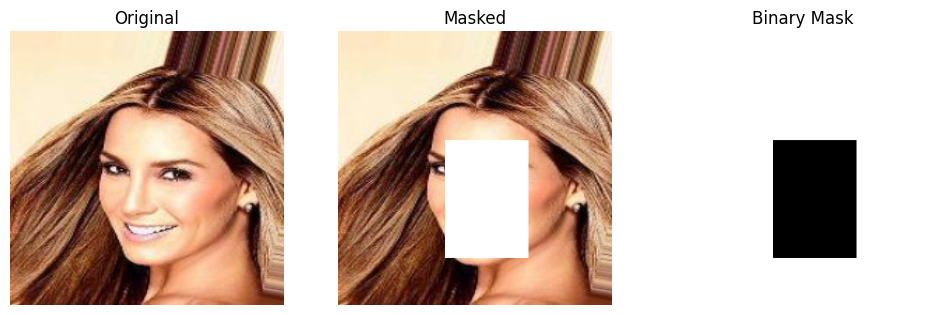

In [8]:
from PIL import Image
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

def apply_random_mask(img_tensor):
    masked = img_tensor.clone()
    mask = torch.ones_like(masked)

    h, w = masked.shape[1], masked.shape[2]
    rect_h, rect_w = np.random.randint(60, 120, size=2)
    top = np.random.randint(0, h - rect_h)
    left = np.random.randint(0, w - rect_w)

    masked[:, top:top+rect_h, left:left+rect_w] = 1.0
    mask[:, top:top+rect_h, left:left+rect_w] = 0.0

    return masked, mask

def show_tensor(t, title):
    plt.imshow(t.permute(1, 2, 0).cpu())
    plt.title(title)
    plt.axis("off")

img = Image.open("celeba/imgs/000001.jpg").convert("RGB")
img_tensor = transform(img)
masked_img, binary_mask = apply_random_mask(img_tensor)

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
show_tensor(img_tensor, "Original")
plt.subplot(1, 3, 2)
show_tensor(masked_img, "Masked")
plt.subplot(1, 3, 3)
show_tensor(binary_mask, "Binary Mask")
plt.show()


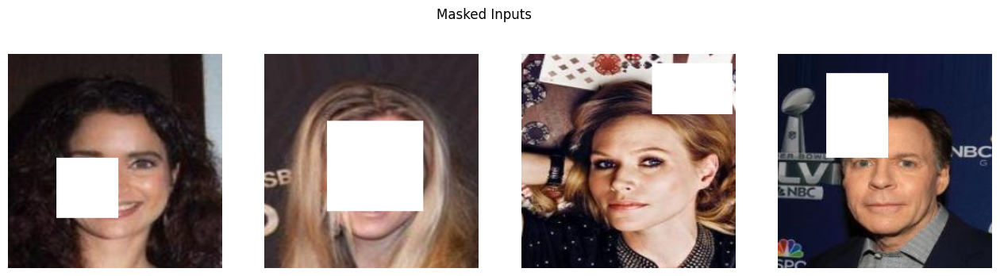

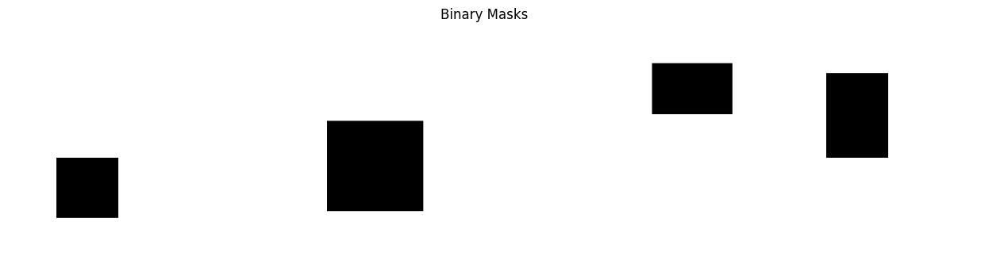

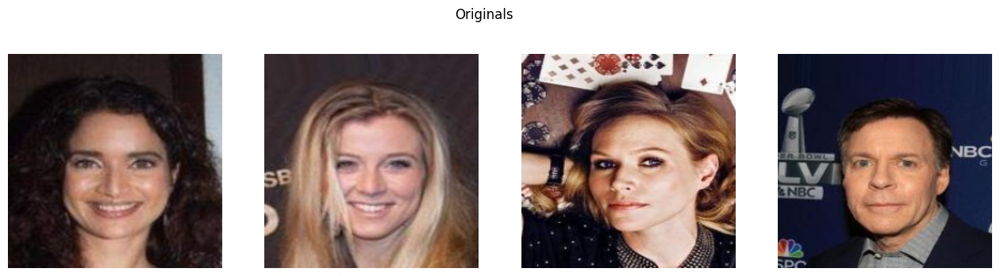

In [10]:
from torch.utils.data import Dataset, DataLoader
from pathlib import Path
from PIL import Image

class CelebADataset(Dataset):
    def __init__(self, img_dir, transform, max_images=150000):
        self.img_dir = Path(img_dir)
        self.transform = transform
        self.files = sorted(self.img_dir.glob("*.jpg"))[:max_images]

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img_path = self.files[idx]
        img = Image.open(img_path).convert("RGB")
        img_tensor = self.transform(img)
        masked_img, mask = apply_random_mask(img_tensor)
        return masked_img, mask, img_tensor

dataset = CelebADataset("celeba/imgs", transform, max_images=150000)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=2, pin_memory=True)

batch = next(iter(dataloader))
masked_imgs, masks, originals = batch

def show_batch(img_batch, title):
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    for i in range(4):
        axs[i].imshow(img_batch[i].permute(1, 2, 0))
        axs[i].axis("off")
    plt.suptitle(title)
    plt.show()

show_batch(masked_imgs, "Masked Inputs")
show_batch(masks, "Binary Masks")
show_batch(originals, "Originals")


In [11]:
import torch.nn as nn
import torch

class InpaintingUNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(4, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.middle = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x, mask):
        x = torch.cat([x, mask], dim=1)
        x = self.encoder(x)
        x = self.middle(x)
        x = self.decoder(x)
        return x

class PatchDiscriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 1, kernel_size=4, padding=1)
        )

    def forward(self, x):
        return self.net(x)


In [12]:
import torchvision.models as models
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class VGGPerceptualLoss(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg16(weights=models.VGG16_Weights.DEFAULT).features[:16]
        self.vgg = vgg.eval().to(device)
        for param in self.vgg.parameters():
            param.requires_grad = False

    def forward(self, x, y):
        return F.mse_loss(self.vgg(x), self.vgg(y))

def total_variation_loss(x):
    return torch.sum(torch.abs(x[:, :, :-1] - x[:, :, 1:])) + torch.sum(torch.abs(x[:, :-1, :] - x[:, 1:, :]))

G = InpaintingUNet().to(device)
D = PatchDiscriminator().to(device)

l1_loss_fn = nn.L1Loss()
perc_loss_fn = VGGPerceptualLoss()
bce_loss_fn = nn.BCEWithLogitsLoss()

optimizer_G = torch.optim.Adam(G.parameters(), lr=1e-4)
optimizer_D = torch.optim.Adam(D.parameters(), lr=1e-4)

scaler = GradScaler()
num_epochs = 2

for epoch in range(num_epochs):
    G.train()
    D.train()
    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")
    for masked_imgs, masks, originals in pbar:
        masked_imgs = masked_imgs.to(device)
        masks = masks[:, :1, :, :].to(device)
        originals = originals.to(device)

        with autocast():
            gen_imgs = G(masked_imgs, masks)
            real_output = D(originals)
            fake_output = D(gen_imgs.detach())

            valid = torch.ones_like(real_output)
            fake = torch.zeros_like(fake_output)

            real_loss = bce_loss_fn(real_output, valid)
            fake_loss = bce_loss_fn(fake_output, fake)
            d_loss = 0.5 * (real_loss + fake_loss)

        optimizer_D.zero_grad()
        scaler.scale(d_loss).backward()
        scaler.step(optimizer_D)

        with autocast():
            gen_patch = D(gen_imgs)
            adv_loss = bce_loss_fn(gen_patch, valid)
            l1 = l1_loss_fn(gen_imgs * (1 - masks), originals * (1 - masks))
            perc = perc_loss_fn(gen_imgs, originals)
            tv = total_variation_loss(gen_imgs)
            g_loss = l1 + 0.1 * perc + 0.001 * tv + 0.01 * adv_loss

        optimizer_G.zero_grad()
        scaler.scale(g_loss).backward()
        scaler.step(optimizer_G)
        scaler.update()

        pbar.set_postfix(G_loss=g_loss.item(), D_loss=d_loss.item())

torch.save(G.state_dict(), "inpainting_unet.pth")


/tmp/ipykernel_517/894349790.py:32: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
Epoch 1/2:   0%|                                                                               | 0/4688 [00:00<?, ?it/s]/tmp/ipykernel_517/894349790.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/tmp/ipykernel_517/894349790.py:60: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 1/2:   0%|▏                                           | 15/4688 [00:06<35:19,  2.20it/s, D_loss=0.469, G_loss=604]


KeyboardInterrupt: 

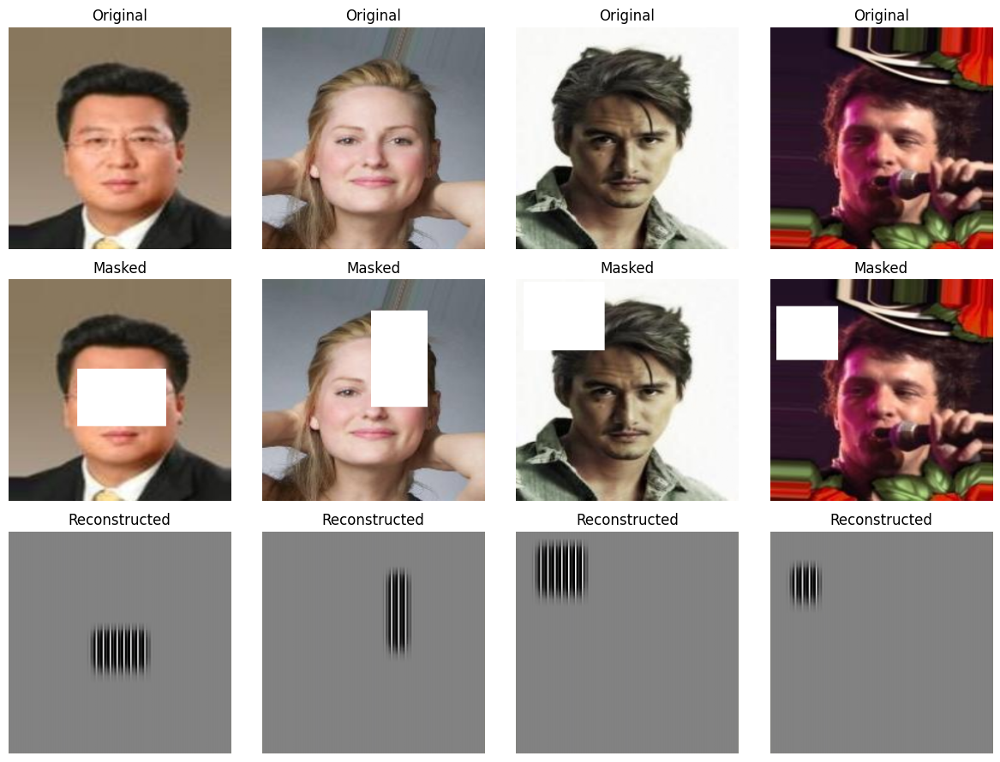

0.004539110232144594 0.9674825668334961


In [9]:
import torch

G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("occlufix/inpainting_unet.pth"))
G.eval()

with torch.no_grad():
    sample_batch = next(iter(dataloader))
    masked_imgs, masks, originals = sample_batch
    masked_imgs = masked_imgs.to(device)
    masks = masks[:, :1, :, :].to(device)
    outputs = G(masked_imgs, masks).cpu()

def show_inpainting_result(originals, masked, reconstructed):
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    for i in range(4):
        axs[0, i].imshow(originals[i].permute(1, 2, 0))
        axs[0, i].set_title("Original")
        axs[1, i].imshow(masked[i].permute(1, 2, 0))
        axs[1, i].set_title("Masked")
        axs[2, i].imshow(reconstructed[i].permute(1, 2, 0))
        axs[2, i].set_title("Reconstructed")
        for j in range(3):
            axs[j, i].axis("off")
    plt.tight_layout()
    plt.show()

show_inpainting_result(originals, masked_imgs.cpu(), outputs)
print(outputs.min().item(), outputs.max().item())


In [10]:
G = InpaintingUNet().to(device)
D = PatchDiscriminator().to(device)

G.load_state_dict(torch.load("occlufix/inpainting_unet.pth"))

l1_loss_fn = nn.L1Loss()
perc_loss_fn = VGGPerceptualLoss()
bce_loss_fn = nn.BCEWithLogitsLoss()

optimizer_G = torch.optim.Adam(G.parameters(), lr=1e-4)
optimizer_D = torch.optim.Adam(D.parameters(), lr=1e-4)

scaler = GradScaler()
start_epoch = 3
end_epoch = 10

for epoch in range(start_epoch, end_epoch + 1):
    G.train()
    D.train()
    pbar = tqdm(dataloader, desc=f"Epoch {epoch}/{end_epoch}")
    for masked_imgs, masks, originals in pbar:
        masked_imgs = masked_imgs.to(device)
        masks = masks[:, :1, :, :].to(device)
        originals = originals.to(device)

        with autocast():
            gen_imgs = G(masked_imgs, masks)
            real_output = D(originals)
            fake_output = D(gen_imgs.detach())

            valid = torch.ones_like(real_output)
            fake = torch.zeros_like(fake_output)

            real_loss = bce_loss_fn(real_output, valid)
            fake_loss = bce_loss_fn(fake_output, fake)
            d_loss = 0.5 * (real_loss + fake_loss)

        optimizer_D.zero_grad()
        scaler.scale(d_loss).backward()
        scaler.step(optimizer_D)

        with autocast():
            gen_patch = D(gen_imgs)
            adv_loss = bce_loss_fn(gen_patch, valid)
            l1 = l1_loss_fn(gen_imgs * (1 - masks), originals * (1 - masks))
            perc = perc_loss_fn(gen_imgs, originals)
            tv = total_variation_loss(gen_imgs)
            g_loss = l1 + 0.1 * perc + 0.001 * tv + 0.01 * adv_loss

        optimizer_G.zero_grad()
        scaler.scale(g_loss).backward()
        scaler.step(optimizer_G)
        scaler.update()

        pbar.set_postfix(G_loss=g_loss.item(), D_loss=d_loss.item())

    torch.save(G.state_dict(), f"occlufix/inpainting_epoch_{epoch}.pth")


/tmp/ipykernel_4450/106206645.py:13: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
Epoch 3/10:   0%|                                                                              | 0/4688 [00:00<?, ?it/s]/tmp/ipykernel_4450/106206645.py:26: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/tmp/ipykernel_4450/106206645.py:42: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 6/10:   1%|▍                                       | 55/4688 [00:18<25:27,  3.03it/s, D_loss=1.54e-5, G_loss=3.55]


KeyboardInterrupt: 

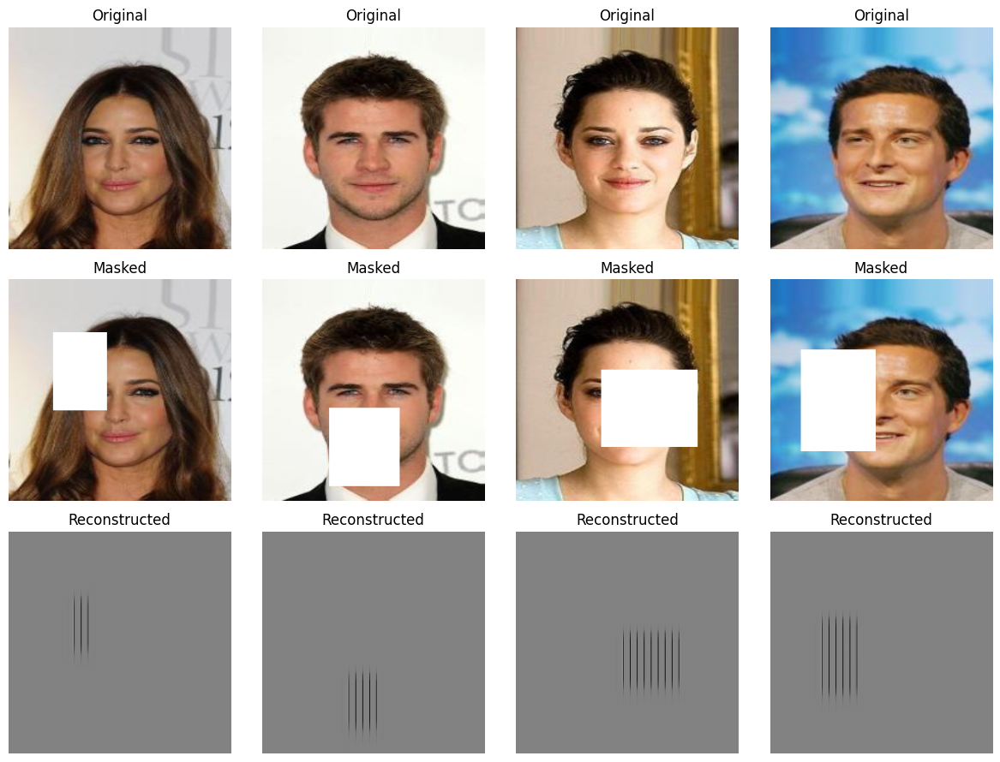

0.06864794343709946 0.5869884490966797


In [12]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("occlufix/inpainting_epoch_5.pth"))
G.eval()

with torch.no_grad():
    sample_batch = next(iter(dataloader))
    masked_imgs, masks, originals = sample_batch
    masked_imgs = masked_imgs.to(device)
    masks = masks[:, :1, :, :].to(device)
    outputs = G(masked_imgs, masks).cpu()

def show_inpainting_result(originals, masked, reconstructed):
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    for i in range(4):
        axs[0, i].imshow(originals[i].permute(1, 2, 0))
        axs[0, i].set_title("Original")
        axs[1, i].imshow(masked[i].permute(1, 2, 0))
        axs[1, i].set_title("Masked")
        axs[2, i].imshow(reconstructed[i].permute(1, 2, 0))
        axs[2, i].set_title("Reconstructed")
        for j in range(3):
            axs[j, i].axis("off")
    plt.tight_layout()
    plt.show()

show_inpainting_result(originals, masked_imgs.cpu(), outputs)
print(outputs.min().item(), outputs.max().item())

In [13]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("occlufix/inpainting_epoch_5.pth"))

l1_loss_fn = nn.L1Loss()
perc_loss_fn = VGGPerceptualLoss()
scaler = GradScaler()

optimizer_G = torch.optim.Adam(G.parameters(), lr=1e-4)

start_epoch = 6
end_epoch = 9

for epoch in range(start_epoch, end_epoch + 1):
    G.train()
    pbar = tqdm(dataloader, desc=f"[Warmup] Epoch {epoch}/{end_epoch}")
    for masked_imgs, masks, originals in pbar:
        masked_imgs = masked_imgs.to(device)
        masks = masks[:, :1, :, :].to(device)
        originals = originals.to(device)

        with autocast():
            gen_imgs = G(masked_imgs, masks)
            l1 = l1_loss_fn(gen_imgs * (1 - masks), originals * (1 - masks))
            perc = perc_loss_fn(gen_imgs, originals)
            tv = total_variation_loss(gen_imgs)
            g_loss = l1 + 0.05 * perc + 0.0005 * tv

        optimizer_G.zero_grad()
        scaler.scale(g_loss).backward()
        scaler.step(optimizer_G)
        scaler.update()

        pbar.set_postfix(G_loss=g_loss.item())

    torch.save(G.state_dict(), f"occlufix/inpainting_epoch_{epoch}_warmup.pth")


/tmp/ipykernel_4450/702015914.py:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
[Warmup] Epoch 6/9:   0%|                                                                      | 0/4688 [00:00<?, ?it/s]/tmp/ipykernel_4450/702015914.py:21: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
[Warmup] Epoch 9/9:   7%|███▍                                           | 340/4688 [01:25<18:14,  3.97it/s, G_loss=1.44]


KeyboardInterrupt: 

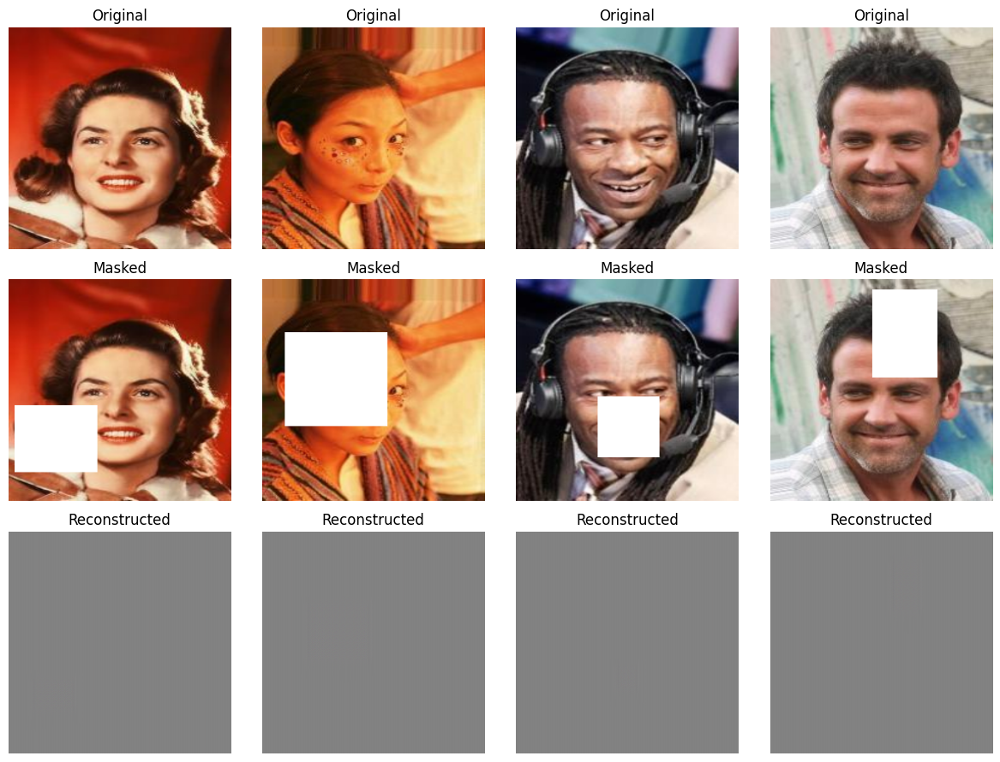

0.4913780689239502 0.5221485495567322


In [14]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("occlufix/inpainting_epoch_8_warmup.pth"))
G.eval()

with torch.no_grad():
    sample_batch = next(iter(dataloader))
    masked_imgs, masks, originals = sample_batch
    masked_imgs = masked_imgs.to(device)
    masks = masks[:, :1, :, :].to(device)
    outputs = G(masked_imgs, masks).cpu()

def show_inpainting_result(originals, masked, reconstructed):
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    for i in range(4):
        axs[0, i].imshow(originals[i].permute(1, 2, 0))
        axs[0, i].set_title("Original")
        axs[1, i].imshow(masked[i].permute(1, 2, 0))
        axs[1, i].set_title("Masked")
        axs[2, i].imshow(reconstructed[i].permute(1, 2, 0))
        axs[2, i].set_title("Reconstructed")
        for j in range(3):
            axs[j, i].axis("off")
    plt.tight_layout()
    plt.show()

show_inpainting_result(originals, masked_imgs.cpu(), outputs)
print(outputs.min().item(), outputs.max().item())


In [16]:
G = InpaintingUNet().to(device)
G.train()

l1_loss_fn = nn.L1Loss()
perc_loss_fn = VGGPerceptualLoss()
optimizer = torch.optim.Adam(G.parameters(), lr=1e-4)
scaler = GradScaler()

start_epoch = 1
end_epoch = 2

for epoch in range(start_epoch, end_epoch + 1):
    running_loss = 0.0
    pbar = tqdm(dataloader, desc=f"[G-only] Epoch {epoch}/{end_epoch}")
    
    for masked_imgs, masks, originals in pbar:
        masked_imgs = masked_imgs.to(device)
        masks = masks[:, :1, :, :].to(device)
        originals = originals.to(device)

        with autocast():
            outputs = G(masked_imgs, masks)
            masked_region = (1 - masks)
            l1 = l1_loss_fn(outputs * masked_region, originals * masked_region)
            perc = perc_loss_fn(outputs, originals)
            loss = l1 + 0.1 * perc

        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        pbar.set_postfix(G_loss=loss.item())

    torch.save(G.state_dict(), f"unmasknet_epoch_{epoch}.pth")


/tmp/ipykernel_4450/3413679093.py:7: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
[G-only] Epoch 1/2:   0%|                                                                      | 0/4688 [00:00<?, ?it/s]/tmp/ipykernel_4450/3413679093.py:21: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
[G-only] Epoch 2/2: 100%|████████████████████████████████████████████| 4688/4688 [19:17<00:00,  4.05it/s, G_loss=0.0422]


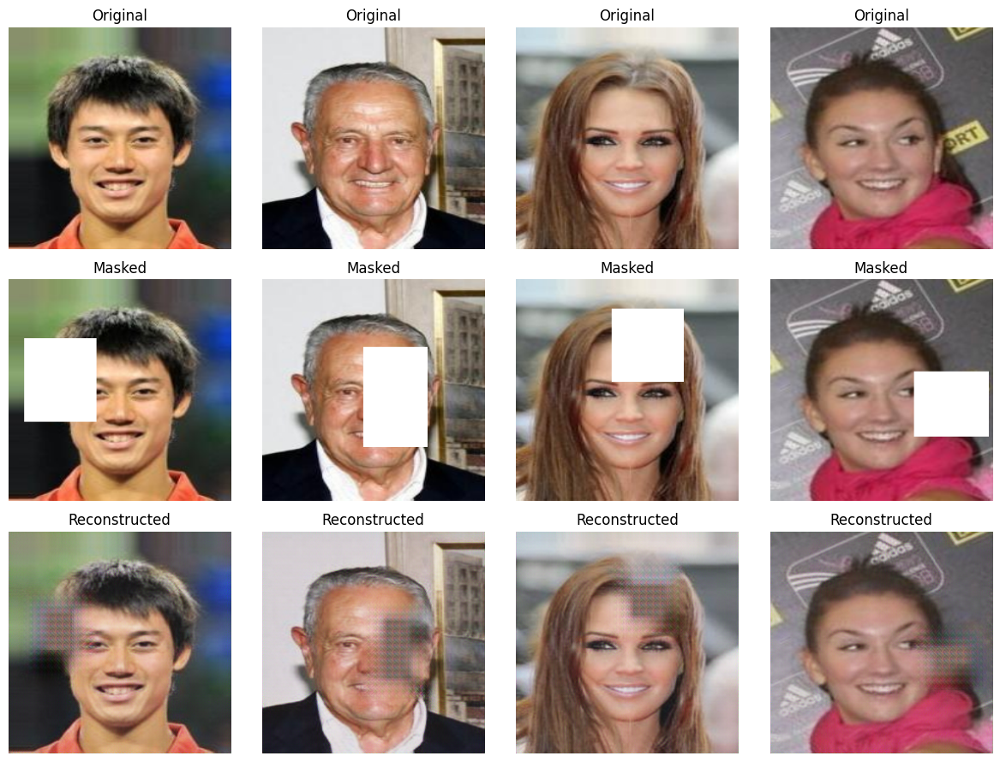

Output pixel range: 0.005139091517776251 0.9789510369300842


In [18]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("occlufix/unmasknet_epoch_2.pth"))
G.eval()

with torch.no_grad():
    masked_imgs, masks, originals = next(iter(dataloader))
    masked_imgs = masked_imgs.to(device)
    masks = masks[:, :1, :, :].to(device)
    outputs = G(masked_imgs, masks).cpu()

def show_inpainting_result(originals, masked, reconstructed):
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    for i in range(4):
        axs[0, i].imshow(originals[i].permute(1, 2, 0))
        axs[0, i].set_title("Original")
        axs[1, i].imshow(masked[i].permute(1, 2, 0))
        axs[1, i].set_title("Masked")
        axs[2, i].imshow(reconstructed[i].permute(1, 2, 0))
        axs[2, i].set_title("Reconstructed")
        for row in axs: row[i].axis("off")
    plt.tight_layout()
    plt.show()

show_inpainting_result(originals, masked_imgs.cpu(), outputs)
print("Output pixel range:", outputs.min().item(), outputs.max().item())


In [13]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("unmasknet_epoch_2.pth"))
G.train()

l1_loss_fn = nn.L1Loss()
perc_loss_fn = VGGPerceptualLoss()
optimizer = torch.optim.Adam(G.parameters(), lr=1e-4)
scaler = GradScaler()

start_epoch = 3
end_epoch = 6

for epoch in range(start_epoch, end_epoch + 1):
    running_loss = 0.0
    pbar = tqdm(dataloader, desc=f"[G-only] Epoch {epoch}/{end_epoch}")

    for masked_imgs, masks, originals in pbar:
        masked_imgs = masked_imgs.to(device)
        masks = masks[:, :1, :, :].to(device)
        originals = originals.to(device)

        with autocast():
            outputs = G(masked_imgs, masks)
            masked_region = (1 - masks)
            l1 = l1_loss_fn(outputs * masked_region, originals * masked_region)
            perc = perc_loss_fn(outputs, originals)
            loss = l1 + 0.1 * perc

        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        pbar.set_postfix(G_loss=loss.item())

    torch.save(G.state_dict(), f"unmasknet_epoch_{epoch}.pth")


/tmp/ipykernel_517/1031048495.py:8: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
[G-only] Epoch 3/6:   0%|                                                                      | 0/4688 [00:00<?, ?it/s]/tmp/ipykernel_517/1031048495.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
[G-only] Epoch 6/6: 100%|████████████████████████████████████████████| 4688/4688 [19:25<00:00,  4.02it/s, G_loss=0.0387]


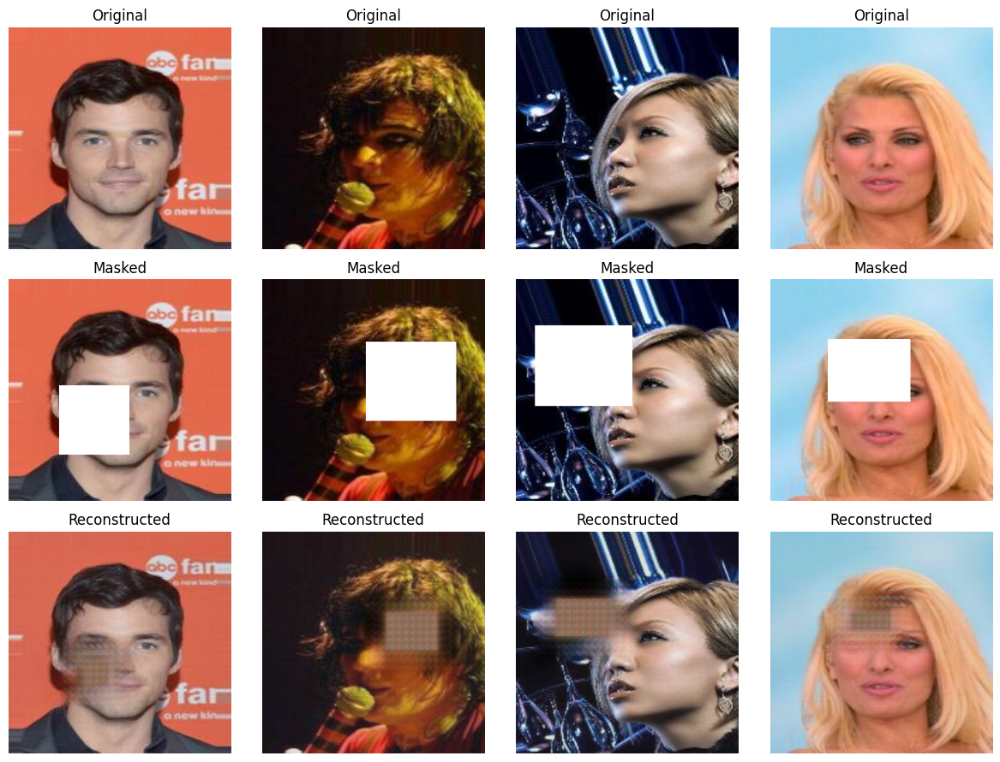

Pixel range: 0.0024712637532502413 0.9912253022193909


In [14]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("unmasknet_epoch_6.pth"))
G.eval()

with torch.no_grad():
    masked_imgs, masks, originals = next(iter(dataloader))
    masked_imgs = masked_imgs.to(device)
    masks = masks[:, :1, :, :].to(device)
    outputs = G(masked_imgs, masks).cpu()

def show_inpainting_result(originals, masked, reconstructed):
    import matplotlib.pyplot as plt
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    for i in range(4):
        axs[0, i].imshow(originals[i].permute(1, 2, 0))
        axs[0, i].set_title("Original")
        axs[1, i].imshow(masked[i].permute(1, 2, 0))
        axs[1, i].set_title("Masked")
        axs[2, i].imshow(reconstructed[i].permute(1, 2, 0))
        axs[2, i].set_title("Reconstructed")
        for j in range(3):
            axs[j, i].axis("off")
    plt.tight_layout()
    plt.show()

show_inpainting_result(originals, masked_imgs.cpu(), outputs)
print("Pixel range:", outputs.min().item(), outputs.max().item())


In [15]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("unmasknet_epoch_6.pth"))
G.train()

l1_loss_fn = nn.L1Loss()
perc_loss_fn = VGGPerceptualLoss()
optimizer = torch.optim.Adam(G.parameters(), lr=1e-4)
scaler = GradScaler()

start_epoch = 7
end_epoch = 10

for epoch in range(start_epoch, end_epoch + 1):
    running_loss = 0.0
    pbar = tqdm(dataloader, desc=f"[G-only] Epoch {epoch}/{end_epoch}")

    for masked_imgs, masks, originals in pbar:
        masked_imgs = masked_imgs.to(device)
        masks = masks[:, :1, :, :].to(device)
        originals = originals.to(device)

        with autocast():
            outputs = G(masked_imgs, masks)
            masked_region = (1 - masks)
            l1 = l1_loss_fn(outputs * masked_region, originals * masked_region)
            perc = perc_loss_fn(outputs, originals)
            loss = l1 + 0.1 * perc

        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        pbar.set_postfix(G_loss=loss.item())

    torch.save(G.state_dict(), f"unmasknet_epoch_{epoch}.pth")


/tmp/ipykernel_517/649595349.py:8: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
[G-only] Epoch 7/10:   0%|                                                                     | 0/4688 [00:00<?, ?it/s]/tmp/ipykernel_517/649595349.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
[G-only] Epoch 10/10: 100%|██████████████████████████████████████████| 4688/4688 [19:29<00:00,  4.01it/s, G_loss=0.0407]


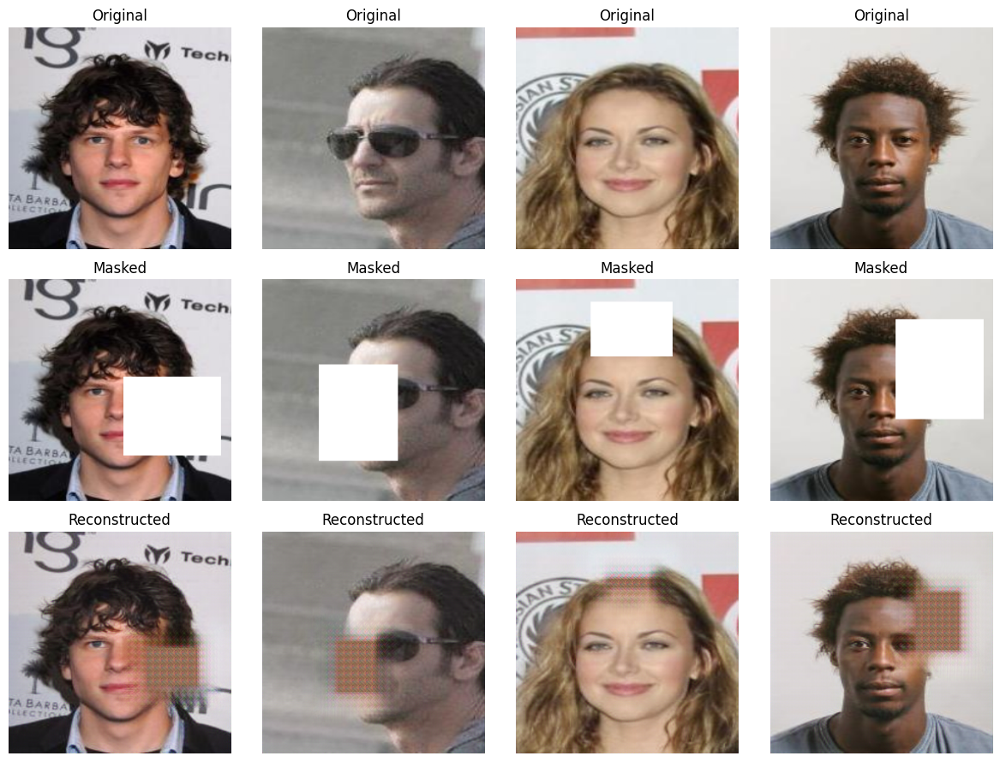

Pixel range: 0.0012237237533554435 0.994870662689209


In [16]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("unmasknet_epoch_10.pth"))
G.eval()

with torch.no_grad():
    masked_imgs, masks, originals = next(iter(dataloader))
    masked_imgs = masked_imgs.to(device)
    masks = masks[:, :1, :, :].to(device)
    outputs = G(masked_imgs, masks).cpu()

def show_inpainting_result(originals, masked, reconstructed):
    import matplotlib.pyplot as plt
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    for i in range(4):
        axs[0, i].imshow(originals[i].permute(1, 2, 0))
        axs[0, i].set_title("Original")
        axs[1, i].imshow(masked[i].permute(1, 2, 0))
        axs[1, i].set_title("Masked")
        axs[2, i].imshow(reconstructed[i].permute(1, 2, 0))
        axs[2, i].set_title("Reconstructed")
        for j in range(3):
            axs[j, i].axis("off")
    plt.tight_layout()
    plt.show()

show_inpainting_result(originals, masked_imgs.cpu(), outputs)
print("Pixel range:", outputs.min().item(), outputs.max().item())


In [17]:
def total_variation_loss(x):
    return torch.mean(torch.abs(x[:, :, :, :-1] - x[:, :, :, 1:])) + \
           torch.mean(torch.abs(x[:, :, :-1, :] - x[:, :, 1:, :]))

G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("unmasknet_epoch_10.pth"))
G.train()

l1_loss_fn = nn.L1Loss()
perc_loss_fn = VGGPerceptualLoss()
scaler = GradScaler()
optimizer = torch.optim.Adam(G.parameters(), lr=1e-4)

start_epoch = 11
end_epoch = 11

for epoch in range(start_epoch, end_epoch + 1):
    running_loss = 0.0
    pbar = tqdm(dataloader, desc=f"[TV] Epoch {epoch}")
    
    for masked_imgs, masks, originals in pbar:
        masked_imgs = masked_imgs.to(device)
        masks = masks[:, :1, :, :].to(device)
        originals = originals.to(device)

        with autocast():
            outputs = G(masked_imgs, masks)
            masked_region = 1 - masks
            l1 = l1_loss_fn(outputs * masked_region, originals * masked_region)
            perc = perc_loss_fn(outputs, originals)
            tv = total_variation_loss(outputs)
            loss = l1 + 0.1 * perc + 0.0005 * tv

        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        pbar.set_postfix(G_loss=loss.item())

    avg_loss = running_loss / len(dataloader)
    print(f"Epoch {epoch} | Avg Loss: {avg_loss:.4f}")
    torch.save(G.state_dict(), f"unmasknet_epoch_{epoch}_tv.pth")


/tmp/ipykernel_517/2499457633.py:11: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
[TV] Epoch 11:   0%|                                                                           | 0/4688 [00:00<?, ?it/s]/tmp/ipykernel_517/2499457633.py:26: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
[TV] Epoch 11: 100%|█████████████████████████████████████████████████| 4688/4688 [19:36<00:00,  3.99it/s, G_loss=0.0396]

Epoch 11 | Avg Loss: 0.0415


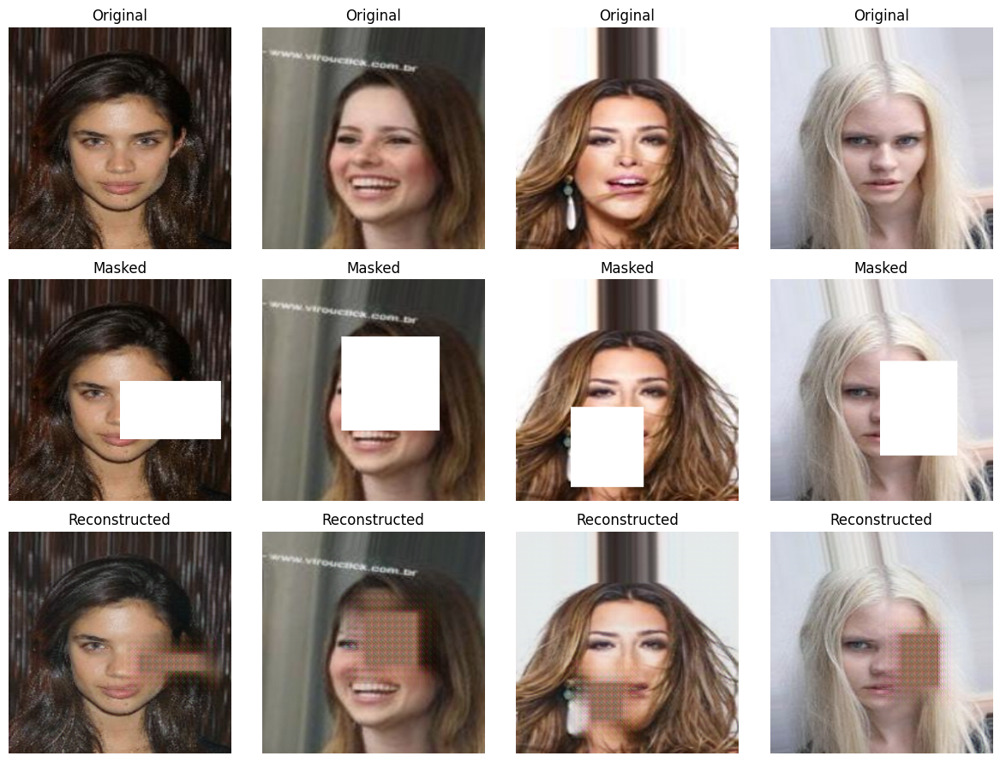

Pixel range: 0.0007802288164384663 0.9701021313667297


In [18]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("unmasknet_epoch_11_tv.pth"))
G.eval()

with torch.no_grad():
    masked_imgs, masks, originals = next(iter(dataloader))
    masked_imgs = masked_imgs.to(device)
    masks = masks[:, :1, :, :].to(device)
    outputs = G(masked_imgs, masks).cpu()

def show_inpainting_result(originals, masked, reconstructed):
    import matplotlib.pyplot as plt
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    for i in range(4):
        axs[0, i].imshow(originals[i].permute(1, 2, 0))
        axs[0, i].set_title("Original")
        axs[1, i].imshow(masked[i].permute(1, 2, 0))
        axs[1, i].set_title("Masked")
        axs[2, i].imshow(reconstructed[i].permute(1, 2, 0))
        axs[2, i].set_title("Reconstructed")
        for j in range(3):
            axs[j, i].axis("off")
    plt.tight_layout()
    plt.show()

show_inpainting_result(originals, masked_imgs.cpu(), outputs)
print("Pixel range:", outputs.min().item(), outputs.max().item())


In [20]:
def total_variation_loss(x):
    return torch.mean(torch.abs(x[:, :, :, :-1] - x[:, :, :, 1:])) + \
           torch.mean(torch.abs(x[:, :, :-1, :] - x[:, :, 1:, :]))

G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("unmasknet_epoch_11_tv.pth"))
G.train()

l1_loss_fn = nn.L1Loss()
perc_loss_fn = VGGPerceptualLoss()
scaler = GradScaler()
optimizer = torch.optim.Adam(G.parameters(), lr=1e-4)

start_epoch = 12
end_epoch = 16

for epoch in range(start_epoch, end_epoch + 1):
    running_loss = 0.0
    pbar = tqdm(dataloader, desc=f"[TV] Epoch {epoch}")

    for masked_imgs, masks, originals in pbar:
        masked_imgs = masked_imgs.to(device)
        masks = masks[:, :1, :, :].to(device)
        originals = originals.to(device)

        with autocast():
            outputs = G(masked_imgs, masks)
            masked_region = 1 - masks
            l1 = l1_loss_fn(outputs * masked_region, originals * masked_region)
            perc = perc_loss_fn(outputs, originals)
            tv = total_variation_loss(outputs)
            loss = l1 + 0.1 * perc + 0.0005 * tv

        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        pbar.set_postfix(G_loss=loss.item())

    avg_loss = running_loss / len(dataloader)
    print(f"Epoch {epoch} | Avg Loss: {avg_loss:.4f}")
    torch.save(G.state_dict(), f"unmasknet_epoch_{epoch}_tv.pth")


/tmp/ipykernel_517/3528311848.py:11: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
[TV] Epoch 12:   0%|                                                                           | 0/4688 [00:00<?, ?it/s]/tmp/ipykernel_517/3528311848.py:26: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
[TV] Epoch 12: 100%|█████████████████████████████████████████████████| 4688/4688 [20:28<00:00,  3.82it/s, G_loss=0.0545]


Epoch 12 | Avg Loss: 0.0412


[TV] Epoch 13: 100%|█████████████████████████████████████████████████| 4688/4688 [20:06<00:00,  3.88it/s, G_loss=0.0404]


Epoch 13 | Avg Loss: 0.0410


[TV] Epoch 14: 100%|█████████████████████████████████████████████████| 4688/4688 [19:54<00:00,  3.93it/s, G_loss=0.0452]


Epoch 14 | Avg Loss: 0.0409


[TV] Epoch 15: 100%|█████████████████████████████████████████████████| 4688/4688 [19:50<00:00,  3.94it/s, G_loss=0.0426]


Epoch 15 | Avg Loss: 0.0407


[TV] Epoch 16: 100%|█████████████████████████████████████████████████| 4688/4688 [19:52<00:00,  3.93it/s, G_loss=0.0363]


Epoch 16 | Avg Loss: 0.0405


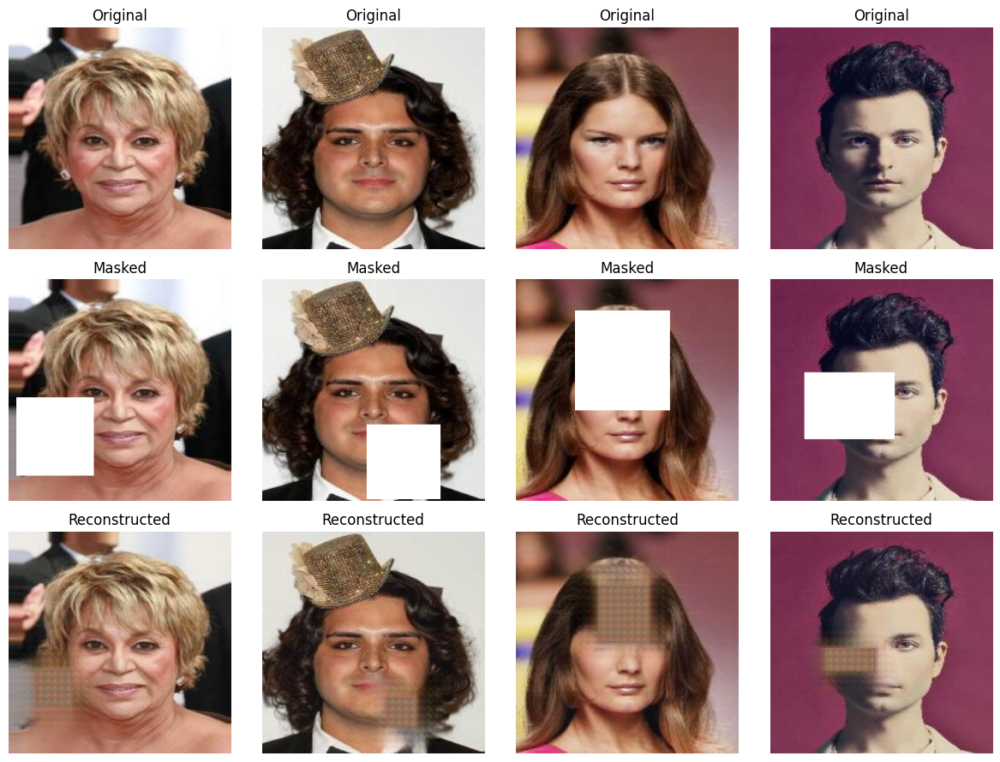

Pixel range: 0.008089646697044373 0.9951025247573853


In [21]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("unmasknet_epoch_16_tv.pth"))
G.eval()

with torch.no_grad():
    masked_imgs, masks, originals = next(iter(dataloader))
    masked_imgs = masked_imgs.to(device)
    masks = masks[:, :1, :, :].to(device)
    outputs = G(masked_imgs, masks).cpu()

def show_inpainting_result(originals, masked, reconstructed):
    import matplotlib.pyplot as plt
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    for i in range(4):
        axs[0, i].imshow(originals[i].permute(1, 2, 0))
        axs[0, i].set_title("Original")
        axs[1, i].imshow(masked[i].permute(1, 2, 0))
        axs[1, i].set_title("Masked")
        axs[2, i].imshow(reconstructed[i].permute(1, 2, 0))
        axs[2, i].set_title("Reconstructed")
        for j in range(3):
            axs[j, i].axis("off")
    plt.tight_layout()
    plt.show()

show_inpainting_result(originals, masked_imgs.cpu(), outputs)
print("Pixel range:", outputs.min().item(), outputs.max().item())


In [22]:
class PatchDiscriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 1, 4, 1, 1)
        )

    def forward(self, x):
        return self.net(x)

def total_variation_loss(x):
    return torch.mean(torch.abs(x[:, :, :, :-1] - x[:, :, :, 1:])) + \
           torch.mean(torch.abs(x[:, :, :-1, :] - x[:, :, 1:, :]))

G = InpaintingUNet().to(device)
D = PatchDiscriminator().to(device)

G.load_state_dict(torch.load("unmasknet_epoch_16_tv.pth"))

optimizer_G = torch.optim.Adam(G.parameters(), lr=1e-4)
optimizer_D = torch.optim.Adam(D.parameters(), lr=1e-4)

l1_loss_fn = nn.L1Loss()
perc_loss_fn = VGGPerceptualLoss()
bce_loss_fn = nn.BCEWithLogitsLoss()
scaler = GradScaler()

start_epoch = 17
end_epoch = 19

for epoch in range(start_epoch, end_epoch + 1):
    G.train()
    D.train()
    pbar = tqdm(dataloader, desc=f"[GAN] Epoch {epoch}/{end_epoch}")

    for masked_imgs, masks, originals in pbar:
        masked_imgs = masked_imgs.to(device)
        masks = masks[:, :1, :, :].to(device)
        originals = originals.to(device)

        with autocast():
            gen_imgs = G(masked_imgs, masks)
            valid = torch.ones_like(D(originals))
            fake = torch.zeros_like(D(gen_imgs.detach()))
            real_loss = bce_loss_fn(D(originals), valid)
            fake_loss = bce_loss_fn(D(gen_imgs.detach()), fake)
            d_loss = 0.5 * (real_loss + fake_loss)

        optimizer_D.zero_grad()
        scaler.scale(d_loss).backward()
        scaler.step(optimizer_D)

        with autocast():
            gen_patch = D(gen_imgs)
            adv_loss = bce_loss_fn(gen_patch, valid)
            l1 = l1_loss_fn(gen_imgs * (1 - masks), originals * (1 - masks))
            perc = perc_loss_fn(gen_imgs, originals)
            tv = total_variation_loss(gen_imgs)
            g_loss = l1 + 0.1 * perc + 0.0005 * tv + 0.001 * adv_loss

        optimizer_G.zero_grad()
        scaler.scale(g_loss).backward()
        scaler.step(optimizer_G)
        scaler.update()

        pbar.set_postfix(G_loss=g_loss.item(), D_loss=d_loss.item())

    torch.save(G.state_dict(), f"unmasknet_epoch_{epoch}_gan.pth")


/tmp/ipykernel_517/3308308240.py:34: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
[GAN] Epoch 17/19:   0%|                                                                       | 0/4688 [00:00<?, ?it/s]/tmp/ipykernel_517/3308308240.py:49: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/tmp/ipykernel_517/3308308240.py:61: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
[GAN] Epoch 19/19: 100%|███████████████████████████████| 4688/4688 [26:30<00:00,  2.95it/s, D_loss=0.398, G_loss=0.0483]


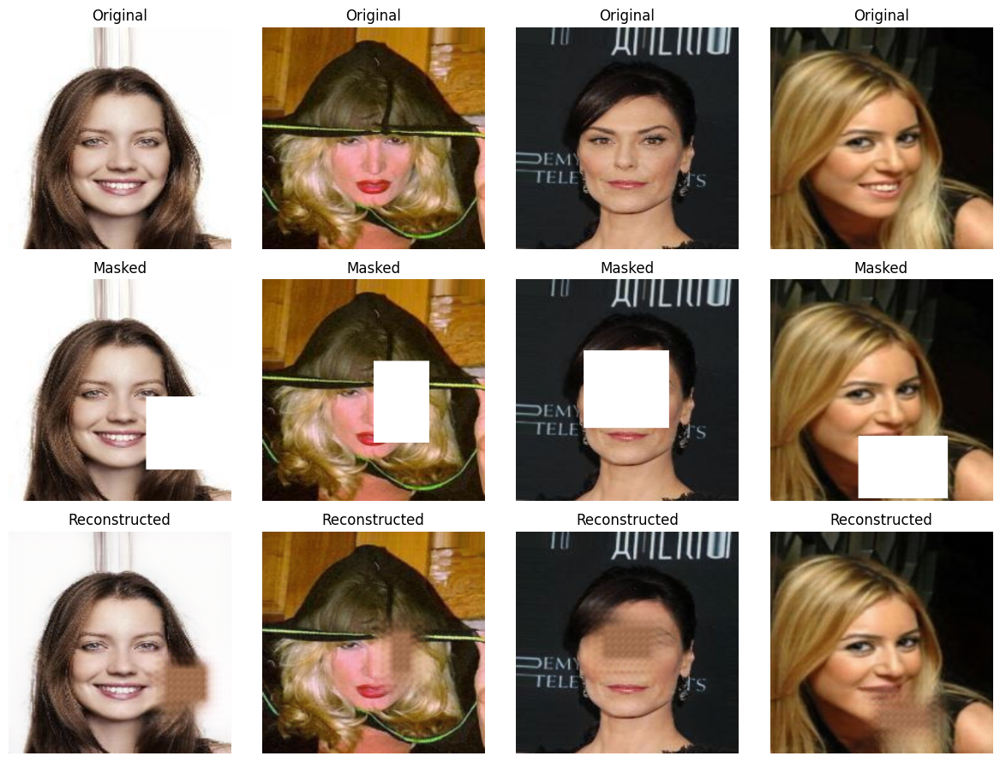

Pixel range: 0.001239206874743104 0.9982554316520691


In [30]:
G = InpaintingUNet().to(device)
G.load_state_dict(torch.load("unmasknet_epoch_19_gan.pth"))
G.eval()

with torch.no_grad():
    import random
    from torch.utils.data import DataLoader, Subset

    indices = random.sample(range(len(dataset)), 32)
    sample_loader = DataLoader(Subset(dataset, indices), batch_size=4)

    masked_imgs, masks, originals = next(iter(sample_loader))
    masked_imgs = masked_imgs.to(device)
    masks = masks[:, :1, :, :].to(device)
    outputs = G(masked_imgs, masks).cpu()

def show_inpainting_result(originals, masked, reconstructed):
    import matplotlib.pyplot as plt
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    for i in range(4):
        axs[0, i].imshow(originals[i].permute(1, 2, 0))
        axs[0, i].set_title("Original")
        axs[1, i].imshow(masked[i].permute(1, 2, 0))
        axs[1, i].set_title("Masked")
        axs[2, i].imshow(reconstructed[i].permute(1, 2, 0))
        axs[2, i].set_title("Reconstructed")
        for j in range(3):
            axs[j, i].axis("off")
    plt.tight_layout()
    plt.show()

show_inpainting_result(originals, masked_imgs.cpu(), outputs)
print("Pixel range:", outputs.min().item(), outputs.max().item())


In [31]:
torch.save(G.state_dict(), "generator_final.pth")
torch.save(D.state_dict(), "discriminator_patchgan.pth")


In [32]:
import pickle

training_state = {
    "epoch": 19,
    "optimizer_G": optimizer_G.state_dict(),
    "optimizer_D": optimizer_D.state_dict(),
    "scaler": scaler.state_dict()
}

with open("training_state.pkl", "wb") as f:
    pickle.dump(training_state, f)
